In [1]:
# Внимание!!! Важно, что бы файлы с данными и исполняемый файл находились в одной папке, 
# тогда пути к тестовым и тренировочным наборам будут содержать только имена файлов.
# 
# В пути к тренировочным и тестовым данным запрежается использовать абсалютную адресацию, 
# то есть адресацию, в которой присутствуют имена папок. Путь должен содержать только имя файла.
#
# Напоминание: под моделью машинного обучения понимаются все действия с исходными данными, 
# которые необходимо произвести, что бы сопоставить признаки целевому значению.

### Область работы 1 (библиотеки)

In [2]:
# Данный блок в области 1 НЕ выполняется преподавателем
# 
# данный блок предназначен только для подключения необходимых библиотек
# запрещается подключать библиотеки в других блоках
# запрещается скрывать предупреждения системы
# установка дополнительных библиотек размещается прямо здесь (обязательно закоментированы)
# pip install


In [142]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.model_selection import cross_val_score, KFold, StratifiedShuffleSplit, GridSearchCV, ShuffleSplit
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, Normalizer
from sklearn.metrics import classification_report, roc_auc_score, RocCurveDisplay, recall_score, precision_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import PrecisionRecallDisplay
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from IPython.display import display_html
from sklearn.metrics import RocCurveDisplay, DetCurveDisplay

### Область работы 2 (поиск  модели .... )

In [2]:
# Данный блок(и) НЕ выполняются преподавателем в области 2
# блок(и) предназначены для поиска лучшей модели 
# должен быть понятен и очевиден отбор параметров модели
# оставляйте свои комментарии и разъяснения
# 
# Запрещается размещать данные блоки за пределами обасти 2
# Все блоки данной области должны быть выполнены
#
# ЗАПРЕЩАЕТСЯ ИСПОЛЬЗОВАТЬ ТЕСТОВЫЙ НАБОР
#
# Путь к тренировочному набору
# 

path_train = 'train.csv' # содержит только имя файла, без имен папок !!!
df = pd.read_csv(path_train)
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,6.4,0.17,0.34,1.5,0.091,42.0,135.0,0.99380,3.25,0.49,9.6,7
1,8.0,0.42,0.36,5.0,0.037,34.0,101.0,0.99200,3.13,0.57,12.3,7
2,6.7,0.27,0.25,8.0,0.053,54.0,202.0,0.99610,3.22,0.43,9.3,5
3,5.2,0.21,0.31,1.7,0.048,17.0,61.0,0.98953,3.24,0.37,12.0,7
4,7.6,0.48,0.37,1.2,0.034,5.0,57.0,0.99256,3.05,0.54,10.4,3


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1725 entries, 0 to 1724
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1725 non-null   float64
 1   volatile acidity      1725 non-null   float64
 2   citric acid           1725 non-null   float64
 3   residual sugar        1725 non-null   float64
 4   chlorides             1725 non-null   float64
 5   free sulfur dioxide   1725 non-null   float64
 6   total sulfur dioxide  1725 non-null   float64
 7   density               1725 non-null   float64
 8   pH                    1725 non-null   float64
 9   sulphates             1725 non-null   float64
 10  alcohol               1725 non-null   float64
 11  quality               1725 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 161.8 KB


In [4]:
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1725.000000,1725.000000,1725.000000,1725.000000,1725.000000,1725.000000,1725.000000,1725.000000,1725.000000,1725.000000,1725.000000,1725.000000
mean,6.821797,0.283849,0.332545,5.725652,0.044460,34.615072,135.248116,0.993532,3.201449,0.492394,10.734348,6.004638
std,0.853886,0.106090,0.122279,4.570812,0.021236,16.751535,42.848854,0.002830,0.151395,0.121452,1.272796,1.071667
min,3.900000,0.085000,0.000000,0.600000,0.012000,3.000000,10.000000,0.987110,2.830000,0.220000,8.400000,3.000000
25%,6.300000,0.210000,0.270000,1.600000,0.034000,23.000000,105.000000,0.991320,3.100000,0.400000,9.600000,5.000000
50%,6.800000,0.270000,0.320000,4.600000,0.041000,33.000000,130.000000,0.993200,3.190000,0.480000,10.600000,6.000000
75%,7.300000,0.330000,0.380000,8.700000,0.049000,45.000000,164.000000,0.995500,3.300000,0.560000,11.700000,7.000000
max,11.800000,1.100000,1.660000,20.700000,0.290000,124.000000,366.500000,1.001820,3.820000,1.080000,14.200000,9.000000


In [5]:
df['buy'] = df['quality'].apply(lambda x: 1 if x >= 7 else 0)

In [6]:
df[df['buy'] == 1] # cильный дисбаланс в данных, используем стратифай

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,buy
0,6.4,0.17,0.34,1.5,0.091,42.0,135.0,0.99380,3.25,0.49,9.6,7,1
1,8.0,0.42,0.36,5.0,0.037,34.0,101.0,0.99200,3.13,0.57,12.3,7,1
3,5.2,0.21,0.31,1.7,0.048,17.0,61.0,0.98953,3.24,0.37,12.0,7,1
8,6.5,0.35,0.36,0.8,0.034,32.0,111.0,0.98942,3.11,0.50,12.1,8,1
9,6.5,0.30,0.27,4.0,0.038,37.0,97.0,0.99026,3.20,0.60,12.6,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716,7.2,0.19,0.31,6.3,0.034,17.0,103.0,0.99305,3.15,0.52,11.4,7,1
1719,6.9,0.24,0.49,1.3,0.032,35.0,148.0,0.99320,3.45,0.57,10.7,7,1
1722,7.0,0.53,0.43,6.1,0.029,6.0,76.0,0.99118,3.08,0.50,12.5,8,1
1723,5.9,0.17,0.29,3.1,0.030,32.0,123.0,0.98913,3.41,0.33,13.7,7,1


In [7]:
#тут слить тест и трэин, проверить на дубликаты, если будет - слив данных
path_train_1 = 'test.csv' # содержит только имя файла, без имен папок !!!
df_2 = pd.read_csv(path_train_1)
df_3 = df.drop('buy', axis = 1)

In [8]:
df_4 = pd.concat([df_2, df_3])
df_4

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.15,0.38,2.2,0.047,33.0,96.0,0.99280,3.13,0.39,10.400000,NaN
1,7.2,0.26,0.32,10.4,0.062,23.0,114.0,0.99660,3.23,0.49,10.500000,NaN
2,6.2,0.36,0.38,3.2,0.031,20.0,89.0,0.98956,3.06,0.33,12.000000,NaN
3,8.6,0.36,0.26,11.1,0.030,43.5,171.0,0.99480,3.03,0.49,12.000000,NaN
4,7.4,0.27,0.52,15.7,0.054,36.0,139.0,0.99788,3.04,0.62,10.033333,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
1720,6.9,0.39,0.22,4.3,0.030,10.0,102.0,0.99300,3.00,0.87,11.600000,4.0
1721,6.4,0.34,0.10,1.1,0.048,19.0,84.0,0.99270,3.21,0.38,9.800000,5.0
1722,7.0,0.53,0.43,6.1,0.029,6.0,76.0,0.99118,3.08,0.50,12.500000,8.0
1723,5.9,0.17,0.29,3.1,0.030,32.0,123.0,0.98913,3.41,0.33,13.700000,7.0


In [10]:
print(df_4[df_4.duplicated()]) #дубликатов нигде нет, всё ок

Empty DataFrame
Columns: [fixed acidity, volatile acidity, citric acid, residual sugar, chlorides, free sulfur dioxide, total sulfur dioxide, density, pH, sulphates, alcohol, quality]
Index: []


In [11]:
df.drop('quality', axis = 1, inplace = True)

In [12]:
df[df['buy'] == 1] # cильный дисбаланс классов, используем стратифай

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,buy
0,6.4,0.17,0.34,1.5,0.091,42.0,135.0,0.99380,3.25,0.49,9.6,1
1,8.0,0.42,0.36,5.0,0.037,34.0,101.0,0.99200,3.13,0.57,12.3,1
3,5.2,0.21,0.31,1.7,0.048,17.0,61.0,0.98953,3.24,0.37,12.0,1
8,6.5,0.35,0.36,0.8,0.034,32.0,111.0,0.98942,3.11,0.50,12.1,1
9,6.5,0.30,0.27,4.0,0.038,37.0,97.0,0.99026,3.20,0.60,12.6,1
...,...,...,...,...,...,...,...,...,...,...,...,...
1716,7.2,0.19,0.31,6.3,0.034,17.0,103.0,0.99305,3.15,0.52,11.4,1
1719,6.9,0.24,0.49,1.3,0.032,35.0,148.0,0.99320,3.45,0.57,10.7,1
1722,7.0,0.53,0.43,6.1,0.029,6.0,76.0,0.99118,3.08,0.50,12.5,1
1723,5.9,0.17,0.29,3.1,0.030,32.0,123.0,0.98913,3.41,0.33,13.7,1


In [13]:
X = df.iloc[:,:-1].values 
y = df.iloc[:,-1].values
print(X.shape)
print(y.shape)

(1725, 11)
(1725,)


In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
#scaler.fit(X_train)

#X_train_scaled = scaler.transform(X_train) 
#X_test_scaled = scaler.transform(X_test)

# Байес

In [15]:
pipe = Pipeline([('preprocessing', MinMaxScaler()), 
                 ('clf',           GaussianNB())])

cv = StratifiedShuffleSplit(test_size = .3, train_size = .6, n_splits = 5)
scaling = [ MinMaxScaler(), StandardScaler(),RobustScaler(), Normalizer()]

param_grid =[
    {'preprocessing': scaling, 
     'clf': [GaussianNB(), MultinomialNB(), BernoulliNB()]}
    ]

grid = GridSearchCV(pipe, param_grid, cv = cv, return_train_score = True, scoring = 'precision')
grid.fit(X_train, y_train)
grid 

/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/s

GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.6),
             estimator=Pipeline(steps=[('preprocessing', MinMaxScaler()),
                                       ('clf', GaussianNB())]),
             param_grid=[{'clf': [GaussianNB(), MultinomialNB(), BernoulliNB()],
                          'preprocessing': [MinMaxScaler(), StandardScaler(),
                                            RobustScaler(), Normalizer()]}],
             return_train_score=True, scoring='precision')

In [16]:
grid_result = pd.DataFrame(grid.cv_results_).sort_values(["rank_test_score",'std_test_score']).T
grid_result

,8,9,10,4,0,1,2,3,7,11,5,6
mean_fit_time,0.001783,0.003782,0.016135,0.00269,0.003191,0.002691,0.006175,0.002013,0.002164,0.002754,0.002684,0.004933
std_fit_time,0.000255,0.001916,0.011135,0.000349,0.001396,0.000805,0.00219,0.00026,0.000371,0.000647,0.000399,0.000227
mean_score_time,0.001521,0.005662,0.011739,0.002592,0.002277,0.001841,0.00209,0.002245,0.00184,0.003034,0.0,0.0
std_score_time,0.000296,0.005782,0.015176,0.002366,0.00057,0.000301,0.000768,0.000445,0.000887,0.001048,0.0,0.0
param_clf,BernoulliNB(),BernoulliNB(),BernoulliNB(),MultinomialNB(),GaussianNB(),GaussianNB(),GaussianNB(),GaussianNB(),MultinomialNB(),BernoulliNB(),MultinomialNB(),MultinomialNB()
param_preprocessing,MinMaxScaler(),StandardScaler(),RobustScaler(),MinMaxScaler(),MinMaxScaler(),StandardScaler(),RobustScaler(),Normalizer(),Normalizer(),Normalizer(),StandardScaler(),RobustScaler()
params,"{'clf': BernoulliNB(), 'preprocessing': MinMax...","{'clf': BernoulliNB(), 'preprocessing': Standa...","{'clf': BernoulliNB(), 'preprocessing': Robust...","{'clf': MultinomialNB(), 'preprocessing': MinM...","{'clf': GaussianNB(), 'preprocessing': MinMaxS...","{'clf': GaussianNB(), 'preprocessing': Standar...","{'clf': GaussianNB(), 'preprocessing': RobustS...","{'clf': GaussianNB(), 'preprocessing': Normali...","{'clf': MultinomialNB(), 'preprocessing': Norm...","{'clf': BernoulliNB(), 'preprocessing': Normal...","{'clf': MultinomialNB(), 'preprocessing': Stan...","{'clf': MultinomialNB(), 'preprocessing': Robu..."
split0_test_score,1.0,0.602151,0.571429,0.0,0.55102,0.55102,0.55102,0.508333,0.0,0.0,NaN,NaN
split1_test_score,0.0,0.616279,0.626506,1.0,0.538462,0.538462,0.538462,0.528846,0.0,0.0,NaN,NaN
split2_test_score,0.666667,0.631579,0.621622,1.0,0.639535,0.639535,0.639535,0.52,0.0,0.0,NaN,NaN


In [17]:
 grid.best_estimator_

Pipeline(steps=[('preprocessing', MinMaxScaler()), ('clf', BernoulliNB())])

In [18]:
pipe_1 = Pipeline(steps=[('preprocessing', RobustScaler()), ('clf', BernoulliNB())])
pipe_1.fit(X_train,y_train)
y_pred_1 = pipe_1.predict(X_test)

print(classification_report(y_test, y_pred_1))
#оценка должна быть не хуже байеса

              precision    recall  f1-score   support

           0       0.81      0.69      0.75       664
           1       0.56      0.72      0.63       371

    accuracy                           0.70      1035
   macro avg       0.69      0.70      0.69      1035
weighted avg       0.72      0.70      0.70      1035



In [19]:
matrix_1=confusion_matrix(y_test,y_pred_1)
matrix_1 #покупаем много, и много плохого, это не очень хорошо

array([[456, 208],
       [104, 267]])

# соседи

In [20]:
#лучшие варинты 10 прогонов контейнера, каждый раз пересплитовавываем данные:

In [22]:
pipe = Pipeline([('preprocessing', RobustScaler()), 
                 ('classifier', KNeighborsClassifier())])

shuffle_split = ShuffleSplit(test_size = .3, train_size = .6, n_splits = 5, random_state = 42)

n_neighbors = [100, 200, 300, 400, 500, 650] #берём большие промежутки, чтобы определить диапазон, так как выборка данных небольшая
#ставлю большое количесво соседей, так как они могут быть далеко расположены друг от друга
p = [1,2,3, 10, 20, 30, 40, 50, 60, 70, 80]
weights=['uniform', 'distance']
scaling = [ MinMaxScaler(), StandardScaler(),RobustScaler(), Normalizer()]

param_grid =[
    {'preprocessing': scaling, 
     'classifier': [KNeighborsClassifier()],
     'classifier__n_neighbors': n_neighbors,
     'classifier__p': p,
     'classifier__weights': weights,
     'classifier__n_jobs' : [-1]
     }
]

grid = GridSearchCV(pipe, param_grid, cv = shuffle_split, return_train_score=True, scoring = 'precision')
grid.fit(X_train, y_train)
grid

/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value N

GridSearchCV(cv=ShuffleSplit(n_splits=5, random_state=42, test_size=0.3, train_size=0.6),
             estimator=Pipeline(steps=[('preprocessing', RobustScaler()),
                                       ('classifier', KNeighborsClassifier())]),
             param_grid=[{'classifier': [KNeighborsClassifier(n_jobs=-1,
                                                              n_neighbors=200,
                                                              p=10)],
                          'classifier__n_jobs': [-1],
                          'classifier__n_neighbors': [100, 200, 300, 400, 500,
                                                      650],
                          'classifier__p': [1, 2, 3, 10, 20, 30, 40, 50, 60, 70,
                                            80],
                          'classifier__weights': ['uniform', 'distance'],
                          'preprocessing': [MinMaxScaler(), StandardScaler(),
                                            RobustScaler()

In [23]:
grid_result = pd.DataFrame(grid.cv_results_).sort_values(["rank_test_score",'std_test_score']).T
grid_result
#при 200 соседях модель переобучается(в том числе на тестах) + большое std, попробую убрать это количество соседей

,113,111,151,159,167,119,127,135,143,175,...,407,408,409,410,411,412,413,414,438,527
mean_fit_time,0.004686,0.001812,0.001317,0.002227,0.001359,0.00233,0.001436,0.002153,0.001337,0.001324,...,0.001382,0.001953,0.002288,0.007038,0.00144,0.001987,0.001495,0.003295,0.006318,0.001479
std_fit_time,0.001664,0.000377,0.000079,0.000348,0.000071,0.000747,0.000135,0.000797,0.000036,0.000059,...,0.000324,0.000382,0.000064,0.001265,0.000426,0.001208,0.000317,0.000098,0.000943,0.000353
mean_score_time,0.064146,0.04147,0.031365,0.04078,0.027626,0.052276,0.033193,0.035779,0.030097,0.029982,...,0.00093,0.000826,0.000698,0.000706,0.00092,0.000705,0.000758,0.000582,0.001886,0.001093
std_score_time,0.013492,0.009225,0.006305,0.00687,0.001358,0.020657,0.005501,0.001723,0.001921,0.003308,...,0.00023,0.000286,0.000034,0.000018,0.000308,0.000131,0.000173,0.000017,0.001932,0.000423
param_classifier,"KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...",...,"KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20...","KNeighborsClassifier(n_jobs=-1, n_neighbors=20..."
param_classifier__n_jobs,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
param_classifier__n_neighbors,200,200,200,200,200,200,200,200,200,200,...,500,500,500,500,500,500,500,500,500,650
param_classifier__p,10,3,50,60,70,10,20,30,40,80,...,40,50,50,50,50,50,50,50,80,80
param_classifier__weights,uniform,distance,distance,distance,distance,distance,distance,distance,distance,distance,...,distance,uniform,uniform,uniform,uniform,distance,distance,distance,distance,distance
param_preprocessing,StandardScaler(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),...,Normalizer(),MinMaxScaler(),StandardScaler(),RobustScaler(),Normalizer(),MinMaxScaler(),StandardScaler(),RobustScaler(),RobustScaler(),Normalizer()


In [24]:
pipe = Pipeline([('preprocessing', RobustScaler()), 
                 ('classifier', KNeighborsClassifier())])

shuffle_split = ShuffleSplit(test_size = .3, train_size = .6, n_splits = 5, random_state = 42)

n_neighbors = [100, 300, 400, 500, 650] #берём большие промежутки, чтобы определить диапазон
p = [1,2,3, 10, 20, 30, 40]
weights=['uniform', 'distance']
scaling = [ MinMaxScaler(), StandardScaler(),RobustScaler(), Normalizer()]

param_grid =[
    {'preprocessing': scaling, 
     'classifier': [KNeighborsClassifier()],
     'classifier__n_neighbors': n_neighbors,
     'classifier__p': p,
     'classifier__weights': weights,
     'classifier__n_jobs' : [-1]
     }
]

grid = GridSearchCV(pipe, param_grid, cv = shuffle_split, return_train_score=True, scoring = 'precision')
grid.fit(X_train, y_train)
grid

/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value N

GridSearchCV(cv=ShuffleSplit(n_splits=5, random_state=42, test_size=0.3, train_size=0.6),
             estimator=Pipeline(steps=[('preprocessing', RobustScaler()),
                                       ('classifier', KNeighborsClassifier())]),
             param_grid=[{'classifier': [KNeighborsClassifier(n_jobs=-1,
                                                              n_neighbors=300,
                                                              p=30,
                                                              weights='distance')],
                          'classifier__n_jobs': [-1],
                          'classifier__n_neighbors': [100, 300, 400, 500, 650],
                          'classifier__p': [1, 2, 3, 10, 20, 30, 40],
                          'classifier__weights': ['uniform', 'distance'],
                          'preprocessing': [MinMaxScaler(), StandardScaler(),
                                            RobustScaler(), Normalizer()]}],
             retur

In [25]:
grid_result = pd.DataFrame(grid.cv_results_).sort_values(["rank_test_score",'std_test_score']).T
grid_result
#при 300 соседях модель переобучается, std большое, пробую убрать 

,100,108,84,92,20,13,6,9,12,5,...,202,201,200,199,198,197,196,195,222,279
mean_fit_time,0.001081,0.001047,0.001067,0.002325,0.00183,0.002181,0.005468,0.00197,0.001711,0.001421,...,0.005028,0.001136,0.0013,0.001308,0.005987,0.00182,0.001695,0.001526,0.00489,0.002403
std_fit_time,0.000118,0.00005,0.000111,0.000659,0.00058,0.000416,0.000864,0.000472,0.000367,0.000068,...,0.000967,0.000028,0.000228,0.000322,0.001321,0.000364,0.000379,0.000353,0.000936,0.000786
mean_score_time,0.032199,0.031071,0.028629,0.051247,0.032897,0.018683,0.02062,0.030356,0.018216,0.012389,...,0.000648,0.000508,0.0006,0.000938,0.001074,0.00091,0.000924,0.000904,0.001354,0.00141
std_score_time,0.006668,0.004669,0.001863,0.006868,0.003406,0.002508,0.001179,0.002029,0.00404,0.001351,...,0.000054,0.000013,0.000056,0.000355,0.00034,0.000348,0.000338,0.000354,0.000371,0.000536
param_classifier,"KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...",...,"KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30...","KNeighborsClassifier(n_jobs=-1, n_neighbors=30..."
param_classifier__n_jobs,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
param_classifier__n_neighbors,300,300,300,300,100,100,100,100,100,100,...,500,500,500,500,500,500,500,500,500,650
param_classifier__p,30,40,10,20,3,2,1,2,2,1,...,20,20,20,10,10,10,10,10,40,40
param_classifier__weights,distance,distance,distance,distance,distance,distance,distance,uniform,distance,distance,...,uniform,uniform,uniform,distance,distance,distance,distance,uniform,distance,distance
param_preprocessing,MinMaxScaler(),MinMaxScaler(),MinMaxScaler(),MinMaxScaler(),MinMaxScaler(),StandardScaler(),RobustScaler(),StandardScaler(),MinMaxScaler(),StandardScaler(),...,RobustScaler(),StandardScaler(),MinMaxScaler(),Normalizer(),RobustScaler(),StandardScaler(),MinMaxScaler(),Normalizer(),RobustScaler(),Normalizer()


In [40]:
pipe = Pipeline([('preprocessing', RobustScaler()), 
                 ('classifier', KNeighborsClassifier())])

shuffle_split = ShuffleSplit(test_size = .3, train_size = .6, n_splits = 5, random_state = 42)

n_neighbors = [100, 150, 10] #берём большие промежутки, чтобы определить диапазон
p = [1,2,3, 10, 20, 30, 40]
weights=['uniform', 'distance']
scaling = [ MinMaxScaler(), StandardScaler(),RobustScaler(), Normalizer()]

param_grid =[
    {'preprocessing': scaling, 
     'classifier': [KNeighborsClassifier()],
     'classifier__n_neighbors': n_neighbors,
     'classifier__p': p,
     'classifier__weights': weights,
     'classifier__n_jobs' : [-1]
     }
]

grid = GridSearchCV(pipe, param_grid, cv = shuffle_split, return_train_score=True, scoring = 'precision')
grid.fit(X_train, y_train)
grid

/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value N

GridSearchCV(cv=ShuffleSplit(n_splits=5, random_state=42, test_size=0.3, train_size=0.6),
             estimator=Pipeline(steps=[('preprocessing', RobustScaler()),
                                       ('classifier', KNeighborsClassifier())]),
             param_grid=[{'classifier': [KNeighborsClassifier(n_jobs=-1,
                                                              n_neighbors=150,
                                                              p=10)],
                          'classifier__n_jobs': [-1],
                          'classifier__n_neighbors': [100, 150, 10],
                          'classifier__p': [1, 2, 3, 10, 20, 30, 40],
                          'classifier__weights': ['uniform', 'distance'],
                          'preprocessing': [MinMaxScaler(), StandardScaler(),
                                            RobustScaler(), Normalizer()]}],
             return_train_score=True, scoring='precision')

In [41]:
grid_result = pd.DataFrame(grid.cv_results_).sort_values(["rank_test_score",'std_test_score']).T
grid_result
#9-я модель даёт относительно хороший результат

,81,89,97,105,88,49,41,96,104,80,...,147,139,143,167,115,159,135,151,127,119
mean_fit_time,0.001535,0.0017,0.001752,0.001555,0.001382,0.002034,0.002937,0.001338,0.001451,0.001488,...,0.001501,0.001333,0.001311,0.003169,0.001898,0.001316,0.001361,0.001285,0.001325,0.00168
std_fit_time,0.00005,0.000201,0.000265,0.000067,0.000064,0.000313,0.000589,0.000059,0.000384,0.000191,...,0.000261,0.000103,0.00007,0.000896,0.000562,0.000043,0.000045,0.000011,0.000044,0.000392
mean_score_time,0.037066,0.035891,0.039923,0.039078,0.040786,0.037263,0.051911,0.034807,0.043818,0.034203,...,0.020469,0.022825,0.012308,0.026344,0.024039,0.012176,0.013012,0.012379,0.00782,0.010342
std_score_time,0.009138,0.003846,0.007329,0.008644,0.008286,0.007893,0.003814,0.003208,0.01521,0.001645,...,0.002176,0.006147,0.000467,0.006807,0.009998,0.000934,0.001241,0.000788,0.000377,0.000242
param_classifier,"KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...",...,"KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15...","KNeighborsClassifier(n_jobs=-1, n_neighbors=15..."
param_classifier__n_jobs,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1
param_classifier__n_neighbors,150,150,150,150,150,100,100,150,150,150,...,10,10,10,10,10,10,10,10,10,10
param_classifier__p,10,20,30,40,20,40,30,30,40,10,...,20,10,10,40,1,30,3,20,2,1
param_classifier__weights,uniform,uniform,uniform,uniform,uniform,uniform,uniform,uniform,uniform,uniform,...,uniform,uniform,distance,distance,uniform,distance,distance,distance,distance,distance
param_preprocessing,StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),MinMaxScaler(),StandardScaler(),StandardScaler(),MinMaxScaler(),MinMaxScaler(),MinMaxScaler(),...,Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer()


In [42]:
grid.cv_results_['params'][81]

{'classifier': KNeighborsClassifier(n_jobs=-1, n_neighbors=150, p=10),
 'classifier__n_jobs': -1,
 'classifier__n_neighbors': 150,
 'classifier__p': 10,
 'classifier__weights': 'uniform',
 'preprocessing': StandardScaler()}

In [43]:
pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
y_pred_2 = pipe_2.predict(X_test)

print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.77      0.88      0.82       664
           1       0.72      0.53      0.61       371

    accuracy                           0.76      1035
   macro avg       0.75      0.71      0.72      1035
weighted avg       0.75      0.76      0.75      1035



In [70]:
#пробую прогнать полученную модель без закрепления рандом стейт
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
y_pred_2 = pipe_2.predict(X_test)

print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.77      0.86      0.81       664
           1       0.68      0.54      0.60       371

    accuracy                           0.74      1035
   macro avg       0.73      0.70      0.71      1035
weighted avg       0.74      0.74      0.74      1035



In [71]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
y_pred_2 = pipe_2.predict(X_test)

print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.78      0.86      0.82       664
           1       0.69      0.56      0.62       371

    accuracy                           0.75      1035
   macro avg       0.73      0.71      0.72      1035
weighted avg       0.75      0.75      0.75      1035



In [72]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
y_pred_2 = pipe_2.predict(X_test)

print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.78      0.85      0.81       664
           1       0.68      0.58      0.62       371

    accuracy                           0.75      1035
   macro avg       0.73      0.71      0.72      1035
weighted avg       0.75      0.75      0.75      1035



In [73]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
y_pred_2 = pipe_2.predict(X_test)

print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.77      0.87      0.81       664
           1       0.69      0.53      0.60       371

    accuracy                           0.75      1035
   macro avg       0.73      0.70      0.71      1035
weighted avg       0.74      0.75      0.74      1035



In [74]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
y_pred_2 = pipe_2.predict(X_test)

print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.78      0.87      0.82       664
           1       0.71      0.57      0.63       371

    accuracy                           0.76      1035
   macro avg       0.74      0.72      0.73      1035
weighted avg       0.76      0.76      0.76      1035



In [75]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
y_pred_2 = pipe_2.predict(X_test)

print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.76      0.88      0.82       664
           1       0.70      0.50      0.58       371

    accuracy                           0.74      1035
   macro avg       0.73      0.69      0.70      1035
weighted avg       0.74      0.74      0.73      1035



In [99]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
y_pred_2 = pipe_2.predict(X_test)

print(classification_report(y_test, y_pred_2))

              precision    recall  f1-score   support

           0       0.77      0.87      0.81       664
           1       0.69      0.53      0.60       371

    accuracy                           0.75      1035
   macro avg       0.73      0.70      0.71      1035
weighted avg       0.74      0.75      0.74      1035



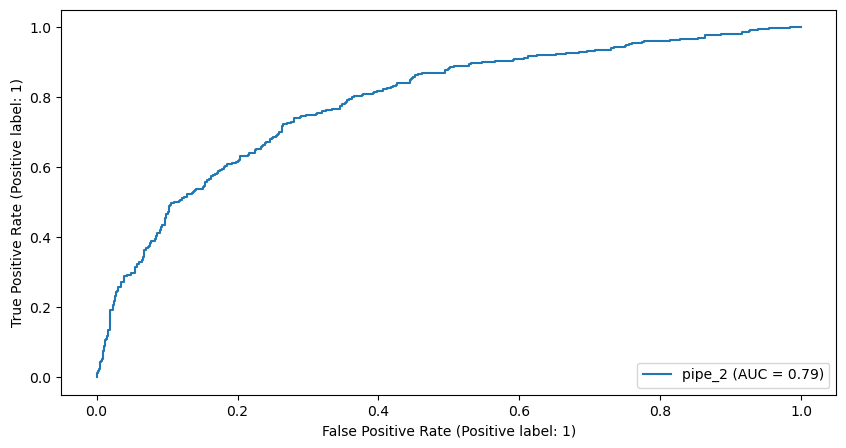

In [79]:
fig, ax_roc = plt.subplots(1,1, figsize=(10, 5))

RocCurveDisplay.from_estimator(pipe_2, X_test, y_test, ax = ax_roc, name = 'pipe_2');

# линейная регрессия

In [93]:
#сделаю несколько прогонов линейной регрессии
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe = Pipeline([('preprocessing', MinMaxScaler()), 
                 ('clf',           LogisticRegression())])

cv = StratifiedShuffleSplit(test_size = .3, train_size = .6, n_splits = 5)
scaling = [ MinMaxScaler(), StandardScaler(),RobustScaler(), Normalizer()]
c = [0,1,2,5,10,15]

param_grid = [
    {'preprocessing': scaling,'clf__penalty': ['l2', 'l1', 'none', 'elasticnet'], 
         'clf__solver': ['newton-cg' ,'lbfgs', 'liblinear', 'sag', 'saga'], 
     'clf__C': c
    }
    ]

grid = GridSearchCV(pipe, param_grid, cv = cv, return_train_score = True, scoring = 'precision')
grid.fit(X_train, y_train)
grid             

/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.6),
             estimator=Pipeline(steps=[('preprocessing', MinMaxScaler()),
                                       ('clf', LogisticRegression())]),
             param_grid=[{'clf__C': [0, 1, 2, 5, 10, 15],
                          'clf__penalty': ['l2', 'l1', 'none', 'elasticnet'],
                          'clf__solver': ['newton-cg', 'lbfgs', 'liblinear',
                                          'sag', 'saga'],
                          'preprocessing': [MinMaxScaler(), StandardScaler(),
                                            RobustScaler(), Normalizer()]}],
             return_train_score=True, scoring='precision')

In [94]:
grid_result = pd.DataFrame(grid.cv_results_).sort_values(["rank_test_score",'std_test_score']).T
grid_result

,43,123,203,283,363,443,57,137,217,297,...,208,195,194,193,192,187,186,185,183,479
mean_fit_time,0.127262,0.079193,0.087157,0.086225,0.087178,0.091692,0.012479,0.011699,0.009772,0.010801,...,0.000932,0.000644,0.002874,0.000847,0.00068,0.000644,0.002823,0.001247,0.001231,0.000718
std_fit_time,0.008285,0.005505,0.012994,0.01354,0.007388,0.011905,0.000131,0.000173,0.000862,0.001746,...,0.00025,0.00006,0.000156,0.000082,0.000037,0.000052,0.000084,0.000374,0.000572,0.000147
mean_score_time,0.00215,0.001369,0.001388,0.001508,0.001369,0.0018,0.00199,0.0018,0.001394,0.001603,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_score_time,0.000251,0.000068,0.000059,0.000242,0.000053,0.000543,0.000396,0.00015,0.000159,0.000395,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
param_clf__C,0,1,2,5,10,15,0,1,2,5,...,2,2,2,2,2,2,2,2,2,15
param_clf__penalty,none,none,none,none,none,none,none,none,none,none,...,none,l1,l1,l1,l1,l1,l1,l1,l1,elasticnet
param_clf__solver,newton-cg,newton-cg,newton-cg,newton-cg,newton-cg,newton-cg,saga,saga,saga,saga,...,liblinear,sag,sag,sag,sag,lbfgs,lbfgs,lbfgs,newton-cg,saga
param_preprocessing,Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),StandardScaler(),StandardScaler(),StandardScaler(),StandardScaler(),...,MinMaxScaler(),Normalizer(),RobustScaler(),StandardScaler(),MinMaxScaler(),Normalizer(),RobustScaler(),StandardScaler(),Normalizer(),Normalizer()
params,"{'clf__C': 0, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 1, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 2, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 5, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 10, 'clf__penalty': 'none', 'clf__s...","{'clf__C': 15, 'clf__penalty': 'none', 'clf__s...","{'clf__C': 0, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 1, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 2, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 5, 'clf__penalty': 'none', 'clf__so...",...,"{'clf__C': 2, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 15, 'clf__penalty': 'elasticnet', '..."
split0_test_score,0.808511,0.808511,0.808511,0.808511,0.808511,0.808511,0.795918,0.795918,0.795918,0.795918,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [95]:
print(grid.best_estimator_)

Pipeline(steps=[('preprocessing', Normalizer()),
                ('clf',
                 LogisticRegression(C=0, penalty='none', solver='newton-cg'))])


In [97]:
pipe_lr = make_pipeline(Normalizer(), LogisticRegression(solver = 'newton-cg', penalty = 'none', C = 0))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.76      0.86      0.81       664
           1       0.67      0.53      0.59       371

    accuracy                           0.74      1035
   macro avg       0.72      0.69      0.70      1035
weighted avg       0.73      0.74      0.73      1035



/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


In [100]:
#сделаю несколько прогонов линейной регрессии
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe = Pipeline([('preprocessing', MinMaxScaler()), 
                 ('clf',           LogisticRegression())])

cv = StratifiedShuffleSplit(test_size = .3, train_size = .6, n_splits = 5)
scaling = [ MinMaxScaler(), StandardScaler(),RobustScaler(), Normalizer()]
c = [0,1,2,5,10,15]

param_grid = [
    {'preprocessing': scaling,'clf__penalty': ['l2', 'l1', 'none', 'elasticnet'], 
         'clf__solver': ['newton-cg' ,'lbfgs', 'liblinear', 'sag', 'saga'], 
     'clf__C': c
    }
    ]

grid = GridSearchCV(pipe, param_grid, cv = cv, return_train_score = True, scoring = 'precision')
grid.fit(X_train, y_train)
grid             

/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.6),
             estimator=Pipeline(steps=[('preprocessing', MinMaxScaler()),
                                       ('clf', LogisticRegression())]),
             param_grid=[{'clf__C': [0, 1, 2, 5, 10, 15],
                          'clf__penalty': ['l2', 'l1', 'none', 'elasticnet'],
                          'clf__solver': ['newton-cg', 'lbfgs', 'liblinear',
                                          'sag', 'saga'],
                          'preprocessing': [MinMaxScaler(), StandardScaler(),
                                            RobustScaler(), Normalizer()]}],
             return_train_score=True, scoring='precision')

In [101]:
grid_result = pd.DataFrame(grid.cv_results_).sort_values(["rank_test_score",'std_test_score']).T
grid_result

,88,295,375,55,215,455,135,80,84,92,...,208,195,194,193,192,187,186,185,183,479
mean_fit_time,0.001975,0.010054,0.008382,0.014909,0.0118,0.008128,0.008237,0.020011,0.008493,0.00453,...,0.001244,0.001064,0.003096,0.000997,0.000822,0.001034,0.004011,0.001322,0.001083,0.000683
std_fit_time,0.000129,0.001447,0.000281,0.000334,0.000767,0.000199,0.000106,0.0046,0.000523,0.001649,...,0.000203,0.000381,0.000102,0.000253,0.000127,0.000404,0.000416,0.000286,0.000455,0.000035
mean_score_time,0.001819,0.001468,0.00124,0.002598,0.00182,0.001209,0.001343,0.002448,0.001277,0.001553,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_score_time,0.000748,0.000105,0.00005,0.00087,0.000199,0.000033,0.000047,0.000768,0.000215,0.000383,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
param_clf__C,1,5,10,0,2,15,1,1,1,1,...,2,2,2,2,2,2,2,2,2,15
param_clf__penalty,l2,none,none,none,none,none,none,l2,l2,l2,...,none,l1,l1,l1,l1,l1,l1,l1,l1,elasticnet
param_clf__solver,liblinear,sag,sag,sag,sag,sag,sag,newton-cg,lbfgs,sag,...,liblinear,sag,sag,sag,sag,lbfgs,lbfgs,lbfgs,newton-cg,saga
param_preprocessing,MinMaxScaler(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),Normalizer(),MinMaxScaler(),MinMaxScaler(),MinMaxScaler(),...,MinMaxScaler(),Normalizer(),RobustScaler(),StandardScaler(),MinMaxScaler(),Normalizer(),RobustScaler(),StandardScaler(),Normalizer(),Normalizer()
params,"{'clf__C': 1, 'clf__penalty': 'l2', 'clf__solv...","{'clf__C': 5, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 10, 'clf__penalty': 'none', 'clf__s...","{'clf__C': 0, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 2, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 15, 'clf__penalty': 'none', 'clf__s...","{'clf__C': 1, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 1, 'clf__penalty': 'l2', 'clf__solv...","{'clf__C': 1, 'clf__penalty': 'l2', 'clf__solv...","{'clf__C': 1, 'clf__penalty': 'l2', 'clf__solv...",...,"{'clf__C': 2, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 15, 'clf__penalty': 'elasticnet', '..."
split0_test_score,0.693878,0.684211,0.684211,0.684211,0.684211,0.684211,0.684211,0.6875,0.6875,0.6875,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [102]:
print(grid.best_estimator_)

Pipeline(steps=[('preprocessing', MinMaxScaler()),
                ('clf', LogisticRegression(C=1, solver='liblinear'))])


In [104]:
pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.77      0.86      0.81       664
           1       0.69      0.55      0.61       371

    accuracy                           0.75      1035
   macro avg       0.73      0.70      0.71      1035
weighted avg       0.74      0.75      0.74      1035



In [105]:
#закреплю рандом стейт
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y, random_state = 42)
pipe = Pipeline([('preprocessing', MinMaxScaler()), 
                 ('clf',           LogisticRegression())])

cv = StratifiedShuffleSplit(test_size = .3, train_size = .6, n_splits = 5)
scaling = [ MinMaxScaler(), StandardScaler(),RobustScaler(), Normalizer()]
c = [0,1,2,5,10,15]

param_grid = [
    {'preprocessing': scaling,'clf__penalty': ['l2', 'l1', 'none', 'elasticnet'], 
         'clf__solver': ['newton-cg' ,'lbfgs', 'liblinear', 'sag', 'saga'], 
     'clf__C': c
    }
    ]

grid = GridSearchCV(pipe, param_grid, cv = cv, return_train_score = True, scoring = 'precision')
grid.fit(X_train, y_train)
grid  

/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/alinaselivanets/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:1483: UserWarning: Setting penalty='none' will ignore the C and l1_ratio parameters
  warnings.warn(


GridSearchCV(cv=StratifiedShuffleSplit(n_splits=5, random_state=None, test_size=0.3,
            train_size=0.6),
             estimator=Pipeline(steps=[('preprocessing', MinMaxScaler()),
                                       ('clf', LogisticRegression())]),
             param_grid=[{'clf__C': [0, 1, 2, 5, 10, 15],
                          'clf__penalty': ['l2', 'l1', 'none', 'elasticnet'],
                          'clf__solver': ['newton-cg', 'lbfgs', 'liblinear',
                                          'sag', 'saga'],
                          'preprocessing': [MinMaxScaler(), StandardScaler(),
                                            RobustScaler(), Normalizer()]}],
             return_train_score=True, scoring='precision')

In [106]:
grid_result = pd.DataFrame(grid.cv_results_).sort_values(["rank_test_score",'std_test_score']).T
grid_result

,350,116,190,400,404,412,178,269,169,173,...,208,195,194,193,192,187,186,185,183,479
mean_fit_time,0.014296,0.013476,0.007036,0.01922,0.014482,0.007594,0.016163,0.035768,0.003773,0.013108,...,0.000826,0.000952,0.003142,0.000984,0.000665,0.001754,0.005923,0.00185,0.001062,0.000711
std_fit_time,0.001268,0.004518,0.001126,0.002694,0.000969,0.000747,0.001962,0.013225,0.000136,0.001666,...,0.000115,0.000227,0.000262,0.000139,0.000044,0.00058,0.000825,0.000256,0.000067,0.000059
mean_score_time,0.002155,0.002771,0.001225,0.002326,0.001357,0.001338,0.001925,0.003273,0.002216,0.002,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std_score_time,0.000719,0.000803,0.000065,0.001145,0.000079,0.000086,0.000523,0.001174,0.000182,0.000317,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
param_clf__C,10,1,2,15,15,15,2,5,2,2,...,2,2,2,2,2,2,2,2,2,15
param_clf__penalty,l1,l1,l1,l2,l2,l2,l2,l1,l2,l2,...,none,l1,l1,l1,l1,l1,l1,l1,l1,elasticnet
param_clf__solver,liblinear,saga,liblinear,newton-cg,lbfgs,sag,saga,liblinear,liblinear,sag,...,liblinear,sag,sag,sag,sag,lbfgs,lbfgs,lbfgs,newton-cg,saga
param_preprocessing,RobustScaler(),MinMaxScaler(),RobustScaler(),MinMaxScaler(),MinMaxScaler(),MinMaxScaler(),RobustScaler(),StandardScaler(),StandardScaler(),StandardScaler(),...,MinMaxScaler(),Normalizer(),RobustScaler(),StandardScaler(),MinMaxScaler(),Normalizer(),RobustScaler(),StandardScaler(),Normalizer(),Normalizer()
params,"{'clf__C': 10, 'clf__penalty': 'l1', 'clf__sol...","{'clf__C': 1, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 15, 'clf__penalty': 'l2', 'clf__sol...","{'clf__C': 15, 'clf__penalty': 'l2', 'clf__sol...","{'clf__C': 15, 'clf__penalty': 'l2', 'clf__sol...","{'clf__C': 2, 'clf__penalty': 'l2', 'clf__solv...","{'clf__C': 5, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l2', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l2', 'clf__solv...",...,"{'clf__C': 2, 'clf__penalty': 'none', 'clf__so...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 2, 'clf__penalty': 'l1', 'clf__solv...","{'clf__C': 15, 'clf__penalty': 'elasticnet', '..."
split0_test_score,0.638889,0.647059,0.647887,0.647887,0.647887,0.647887,0.638889,0.638889,0.638889,0.638889,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [107]:
print(grid.best_estimator_)

Pipeline(steps=[('preprocessing', RobustScaler()),
                ('clf',
                 LogisticRegression(C=10, penalty='l1', solver='liblinear'))])


In [108]:
pipe_lr = make_pipeline(RobustScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 10))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)

print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.79      0.84      0.82       664
           1       0.68      0.61      0.64       371

    accuracy                           0.76      1035
   macro avg       0.74      0.72      0.73      1035
weighted avg       0.75      0.76      0.75      1035



In [111]:
#регрессия даёт примерно одинаковое значение пресижн

In [112]:
#Несколько раз прогоним последнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(RobustScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 10))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)

print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.78      0.86      0.82       664
           1       0.70      0.56      0.62       371

    accuracy                           0.76      1035
   macro avg       0.74      0.71      0.72      1035
weighted avg       0.75      0.76      0.75      1035



In [113]:
#Несколько раз прогоним последнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(RobustScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 10))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)

print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.78      0.85      0.82       664
           1       0.69      0.57      0.63       371

    accuracy                           0.75      1035
   macro avg       0.73      0.71      0.72      1035
weighted avg       0.75      0.75      0.75      1035



In [114]:
#Несколько раз прогоним последнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(RobustScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 10))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)

print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.80      0.85      0.82       664
           1       0.70      0.61      0.65       371

    accuracy                           0.77      1035
   macro avg       0.75      0.73      0.74      1035
weighted avg       0.76      0.77      0.76      1035



In [115]:
#Несколько раз прогоним последнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(RobustScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 10))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)

print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.79      0.81      0.80       664
           1       0.65      0.61      0.63       371

    accuracy                           0.74      1035
   macro avg       0.72      0.71      0.72      1035
weighted avg       0.74      0.74      0.74      1035



In [116]:
#Несколько раз прогоним последнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(RobustScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 10))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)

print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.80      0.82      0.81       664
           1       0.66      0.63      0.64       371

    accuracy                           0.75      1035
   macro avg       0.73      0.72      0.73      1035
weighted avg       0.75      0.75      0.75      1035



In [ ]:
#Несколько раз прогоним последнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(RobustScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l1', C = 10))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)

print(classification_report(y_test, y_pred_lr))

In [117]:
#несколько раз прогоним предпоследнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.79      0.86      0.82       664
           1       0.70      0.58      0.64       371

    accuracy                           0.76      1035
   macro avg       0.74      0.72      0.73      1035
weighted avg       0.76      0.76      0.76      1035



In [118]:
#несколько раз прогоним предпоследнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.77      0.87      0.82       664
           1       0.70      0.54      0.61       371

    accuracy                           0.75      1035
   macro avg       0.74      0.71      0.71      1035
weighted avg       0.75      0.75      0.74      1035



In [119]:
#несколько раз прогоним предпоследнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.77      0.84      0.81       664
           1       0.67      0.56      0.61       371

    accuracy                           0.74      1035
   macro avg       0.72      0.70      0.71      1035
weighted avg       0.74      0.74      0.74      1035



In [120]:
#несколько раз прогоним предпоследнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.76      0.87      0.81       664
           1       0.69      0.52      0.59       371

    accuracy                           0.74      1035
   macro avg       0.73      0.69      0.70      1035
weighted avg       0.74      0.74      0.73      1035



In [121]:
#несколько раз прогоним предпоследнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.77      0.85      0.81       664
           1       0.67      0.54      0.60       371

    accuracy                           0.74      1035
   macro avg       0.72      0.70      0.70      1035
weighted avg       0.73      0.74      0.73      1035



In [122]:
#несколько раз прогоним предпоследнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.77      0.84      0.81       664
           1       0.67      0.56      0.61       371

    accuracy                           0.74      1035
   macro avg       0.72      0.70      0.71      1035
weighted avg       0.73      0.74      0.74      1035



In [123]:
#несколько раз прогоним предпоследнюю модель
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
y_pred_lr = pipe_lr.predict(X_test)
print(classification_report(y_test, y_pred_lr))

              precision    recall  f1-score   support

           0       0.76      0.89      0.82       664
           1       0.73      0.51      0.60       371

    accuracy                           0.75      1035
   macro avg       0.75      0.70      0.71      1035
weighted avg       0.75      0.75      0.74      1035



In [ ]:
#может быть повезло, но эта модель даёт лучшее значение пресижн

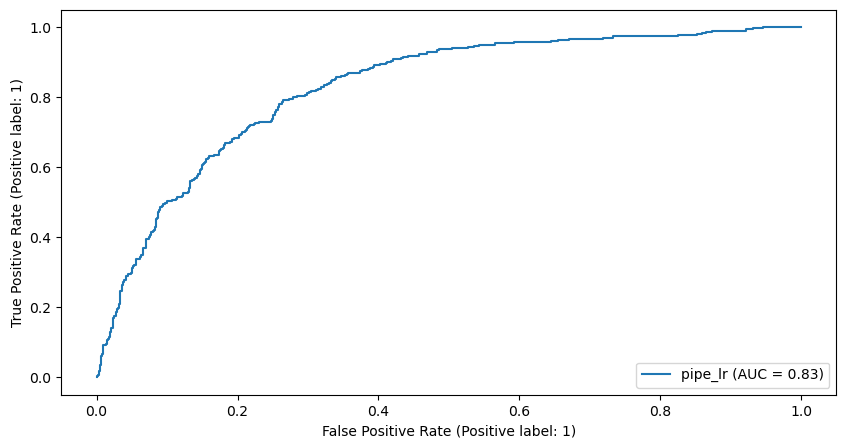

In [124]:
fig, ax_roc = plt.subplots(1,1, figsize=(10, 5))

RocCurveDisplay.from_estimator(pipe_lr, X_test, y_test, ax = ax_roc, name = 'pipe_lr');

# Выбор из трёх моделей

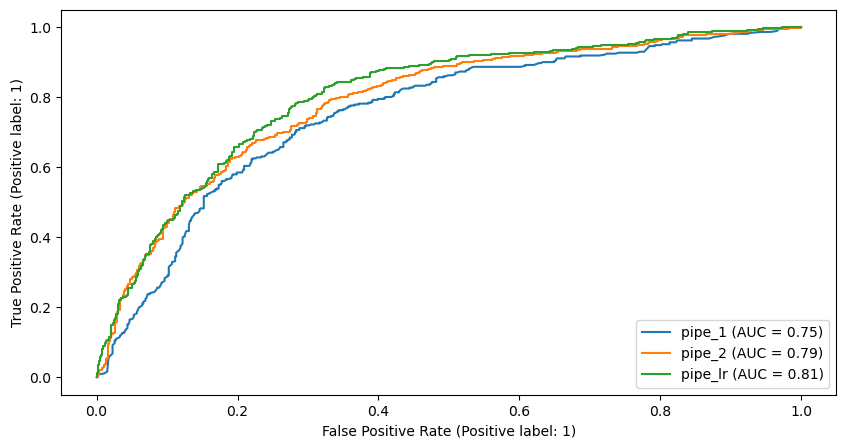

In [136]:
fig,ax_roc = plt.subplots(1,1, figsize=(10, 5))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_1 = Pipeline(steps=[('preprocessing', RobustScaler()), ('clf', BernoulliNB())])
pipe_1.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_1, X_test, y_test, ax = ax_roc, name = 'pipe_1');

pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_2, X_test, y_test, ax = ax_roc, name = 'pipe_2');

pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_lr, X_test, y_test, ax = ax_roc, name = 'pipe_lr');


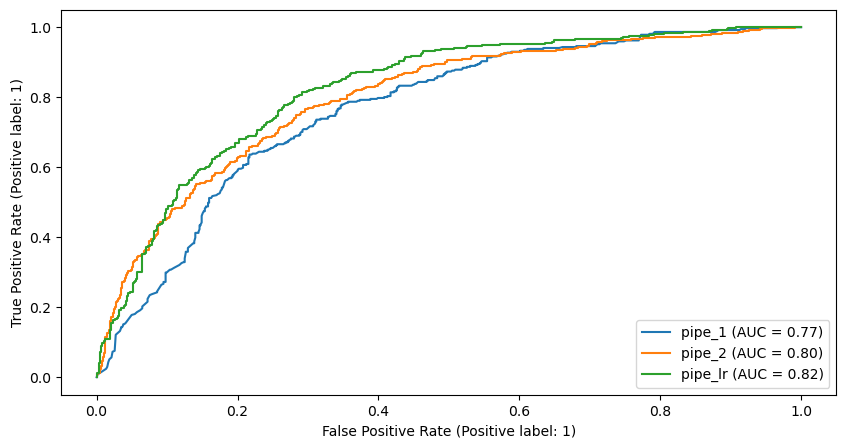

In [137]:
fig,ax_roc = plt.subplots(1,1, figsize=(10, 5))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_1 = Pipeline(steps=[('preprocessing', RobustScaler()), ('clf', BernoulliNB())])
pipe_1.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_1, X_test, y_test, ax = ax_roc, name = 'pipe_1');

pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_2, X_test, y_test, ax = ax_roc, name = 'pipe_2');

pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_lr, X_test, y_test, ax = ax_roc, name = 'pipe_lr');

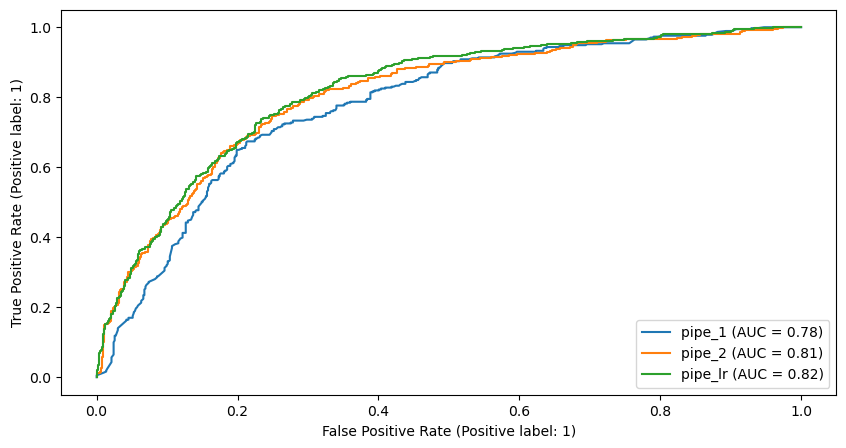

In [138]:
fig,ax_roc = plt.subplots(1,1, figsize=(10, 5))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_1 = Pipeline(steps=[('preprocessing', RobustScaler()), ('clf', BernoulliNB())])
pipe_1.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_1, X_test, y_test, ax = ax_roc, name = 'pipe_1');

pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_2, X_test, y_test, ax = ax_roc, name = 'pipe_2');

pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_lr, X_test, y_test, ax = ax_roc, name = 'pipe_lr');

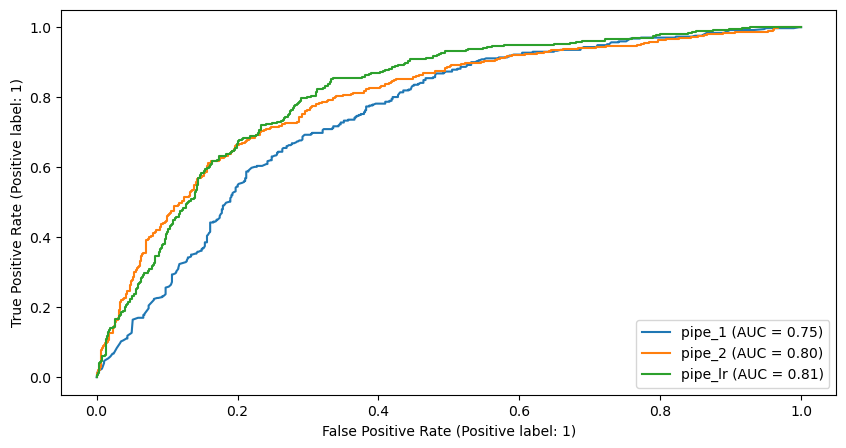

In [139]:
fig,ax_roc = plt.subplots(1,1, figsize=(10, 5))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_1 = Pipeline(steps=[('preprocessing', RobustScaler()), ('clf', BernoulliNB())])
pipe_1.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_1, X_test, y_test, ax = ax_roc, name = 'pipe_1');

pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_2, X_test, y_test, ax = ax_roc, name = 'pipe_2');

pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_lr, X_test, y_test, ax = ax_roc, name = 'pipe_lr');

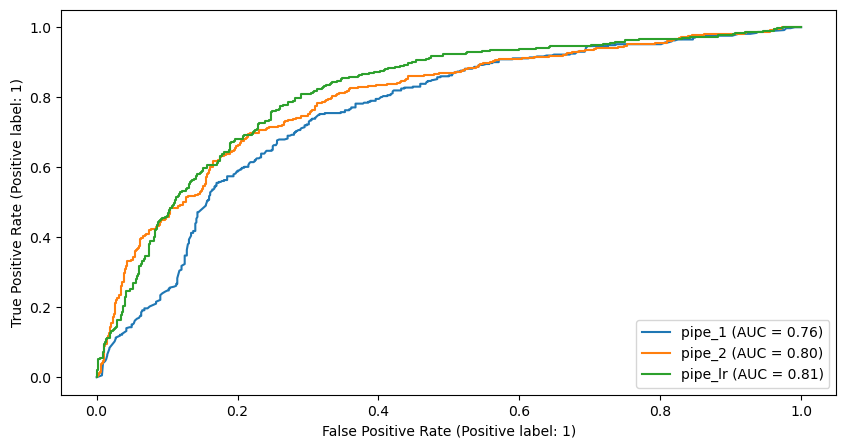

In [140]:
fig,ax_roc = plt.subplots(1,1, figsize=(10, 5))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_1 = Pipeline(steps=[('preprocessing', RobustScaler()), ('clf', BernoulliNB())])
pipe_1.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_1, X_test, y_test, ax = ax_roc, name = 'pipe_1');

pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_2, X_test, y_test, ax = ax_roc, name = 'pipe_2');

pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_lr, X_test, y_test, ax = ax_roc, name = 'pipe_lr');

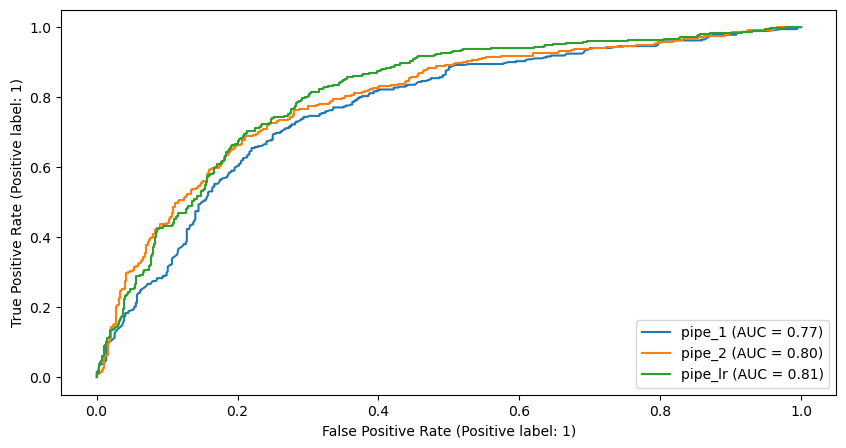

In [141]:
fig,ax_roc = plt.subplots(1,1, figsize=(10, 5))
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.6, stratify=y)
pipe_1 = Pipeline(steps=[('preprocessing', RobustScaler()), ('clf', BernoulliNB())])
pipe_1.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_1, X_test, y_test, ax = ax_roc, name = 'pipe_1');

pipe_2 = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors = 150, p=10, weights='distance'))
pipe_2.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_2, X_test, y_test, ax = ax_roc, name = 'pipe_2');

pipe_lr = make_pipeline(MinMaxScaler(), LogisticRegression(solver = 'liblinear', penalty = 'l2', C = 1))
pipe_lr.fit(X_train,y_train)
RocCurveDisplay.from_estimator(pipe_lr, X_test, y_test, ax = ax_roc, name = 'pipe_lr');

In [ ]:
#в среднем, модель линейной регресии показывает значение лучшее, чем байес и соседи, выбираю эту модель